In [1]:
%run setup.ipynb

In [2]:
xpehh_raw = phase1_selection.xpehh_raw
xpehh_raw

Group(/, 5)
  groups: 5; 2L, 2R, 3L, 3R, X
  store: DirectoryStore

In [18]:
list(xpehh_raw['2R'])

['AOMvsGWA',
 'BFMvsAOM',
 'BFMvsGWA',
 'BFSvsBFM',
 'BFSvsGWA',
 'BFSvsUGS',
 'CMS_savannavsBFS',
 'CMS_savannavsGAS',
 'CMS_savannavsGWA',
 'CMS_savannavsUGS',
 'GASvsAOM',
 'GASvsBFS',
 'GASvsGWA',
 'UGSvsGWA']

## Investigate windowed summarisation options

In [3]:
def fraction_above(threshold):
    def f(values):
        return np.count_nonzero(values >= threshold) / values.size
    return f

In [25]:
import warnings

In [73]:
def compare_summaries(seqid, pop1, pop2, flip=False, position_window_size=20000, moving_window_size=1000, figsize=(15, 8)):
    
    # setup raw values
    comparison = '%svs%s' % (pop1, pop2)
    focal_pop = pop2 if flip else pop1
    ref_pop = pop1 if flip else pop2
    grp = xpehh_raw[seqid][comparison]
    pos = grp['POS'][:]
    values = grp['XPEHH_zscore'][:]
    if flip:
        values = - values
    nomiss = ~np.isnan(values)
    pos_nomiss = pos[nomiss]
    values_nomiss = values[nomiss]
    
    # setup figure
    relseqlen = len(genome[seqid]) / len(genome['2R'])
    fig, axs = plt.subplots(nrows=6, ncols=2, figsize=(1 + (figsize[0] * relseqlen), figsize[1]), sharex=True)
    plot_kwargs = dict(marker='o', linestyle=' ', markersize=2, mfc='none', mew=.5)

    # position windows
    windows = allel.stats.window.position_windows(pos, size=position_window_size, start=1, stop=len(genome[seqid]), step=position_window_size)
    wx = ((windows[:, 0] + windows[:, 1]) / 2) / 1e6
    print('position windows:', wx.shape[0])
    wy_max, _, _ = allel.windowed_statistic(pos_nomiss, values_nomiss, statistic=np.max, windows=windows)    
    wy_pc50, _, _ = allel.windowed_statistic(pos_nomiss, values_nomiss, statistic=lambda values: np.percentile(values, 50), windows=windows)
    wy_pc90, _, _ = allel.windowed_statistic(pos_nomiss, values_nomiss, statistic=lambda values: np.percentile(values, 90), windows=windows)  
    wy_frc1, _, _ = allel.windowed_statistic(pos_nomiss, values_nomiss, statistic=fraction_above(1), windows=windows)
    wy_frc2, _, _ = allel.windowed_statistic(pos_nomiss, values_nomiss, statistic=fraction_above(2), windows=windows)
    # plot
    ax = axs[0, 0]
    ax.plot(pos_nomiss / 1e6, values_nomiss, **plot_kwargs)
    ax.set_ylabel('Raw values')   
    ax.set_ylim(bottom=0)
    ax.set_title('Position windows (%s)' % position_window_size)
    ax = axs[1, 0]
    ax.plot(wx, wy_max, **plot_kwargs)
    ax.set_ylabel('Maximum')   
    ax.set_ylim(bottom=0)
    ax = axs[2, 0]
    ax.plot(wx, wy_pc50, **plot_kwargs)
    ax.set_ylabel('Median') 
    ax.set_ylim(bottom=0)
    ax = axs[3, 0]
    ax.plot(wx, wy_pc90, **plot_kwargs)
    ax.set_ylabel('90th percentile')   
    ax.set_ylim(bottom=0)
    ax = axs[4, 0]
    ax.plot(wx, wy_frc1, **plot_kwargs)
    ax.set_ylabel('Fraction >= 1')  
    ax.set_ylim(bottom=0)
    ax = axs[5, 0]
    ax.plot(wx, wy_frc2, **plot_kwargs)
    ax.set_ylabel('Fraction >= 2') 
    ax.set_ylim(bottom=0)
    ax.set_xlabel('Chromosome %s position (Mbp)' % seqid)
    ax.set_xlim(0, len(genome[seqid]) / 1e6)
    
    # moving windows
    wx = allel.moving_statistic(pos_nomiss, statistic=np.mean, size=moving_window_size) / 1e6
    print('moving windows:', wx.shape[0])
    wy_max = allel.moving_statistic(values_nomiss, statistic=np.max, size=moving_window_size)    
    wy_pc50 = allel.moving_statistic(values_nomiss, statistic=lambda values: np.percentile(values, 50), size=moving_window_size)
    wy_pc90 = allel.moving_statistic(values_nomiss, statistic=lambda values: np.percentile(values, 90), size=moving_window_size)  
    wy_frc1 = allel.moving_statistic(values_nomiss, statistic=fraction_above(1), size=moving_window_size)
    wy_frc2 = allel.moving_statistic(values_nomiss, statistic=fraction_above(2), size=moving_window_size)
    # plot
    ax = axs[0, 1]
    ax.plot(pos_nomiss / 1e6, values_nomiss, **plot_kwargs)
#     ax.set_ylabel('Raw values')   
    ax.set_ylim(axs[0, 0].get_ylim())
    ax.yaxis.tick_right()
    ax.set_title('Moving windows (%s)' % moving_window_size)
    ax = axs[1, 1]
    ax.plot(wx, wy_max, **plot_kwargs)
#     ax.set_ylabel('Maximum')   
    ax.set_ylim(axs[1, 0].get_ylim())
    ax.yaxis.tick_right()
    ax = axs[2, 1]
    ax.plot(wx, wy_pc50, **plot_kwargs)
#     ax.set_ylabel('Median') 
    ax.set_ylim(axs[2, 0].get_ylim())
    ax.yaxis.tick_right()
    ax = axs[3, 1]
    ax.plot(wx, wy_pc90, **plot_kwargs)
#     ax.set_ylabel('90th percentile')   
    ax.set_ylim(axs[3, 0].get_ylim())
    ax.yaxis.tick_right()
    ax = axs[4, 1]
    ax.plot(wx, wy_frc1, **plot_kwargs)
#     ax.set_ylabel('Fraction >= 1')  
    ax.set_ylim(axs[4, 0].get_ylim())
    ax.yaxis.tick_right()
    ax = axs[5, 1]
    ax.plot(wx, wy_frc2, **plot_kwargs)
#     ax.set_ylabel('Fraction >= 2') 
    ax.set_ylim(axs[5, 0].get_ylim())
    ax.yaxis.tick_right()
    ax.set_xlabel('Chromosome %s position (Mbp)' % seqid)
    ax.set_xlim(0, len(genome[seqid]) / 1e6)
    
    fig.suptitle('%s, %s (versus %s)' % (seqid, focal_pop, ref_pop), fontsize=14, fontweight='bold', y=1.01)
    fig.tight_layout()
    
    

### BFS (versus GWA)

position windows: 3078
moving windows: 5547


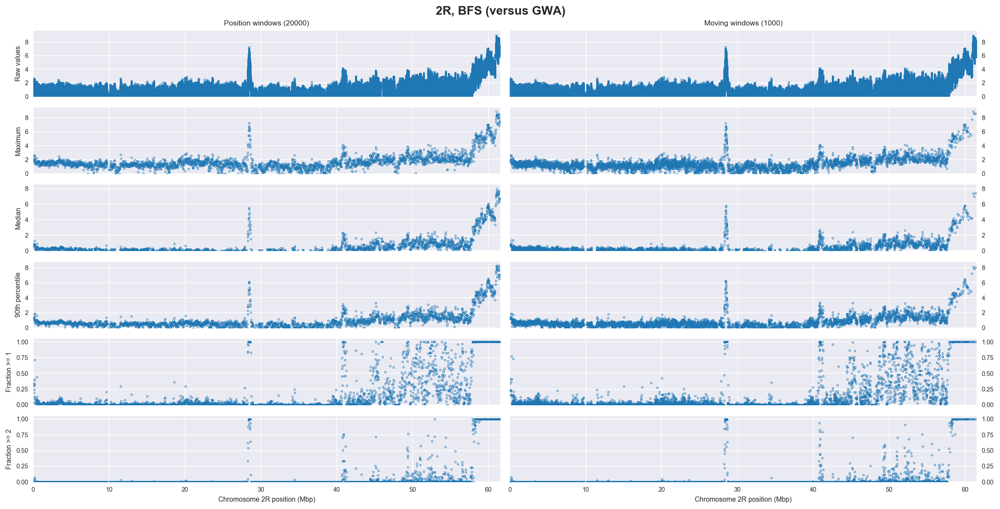

In [74]:
compare_summaries('2R', 'BFS', 'GWA')

position windows: 2469
moving windows: 4148


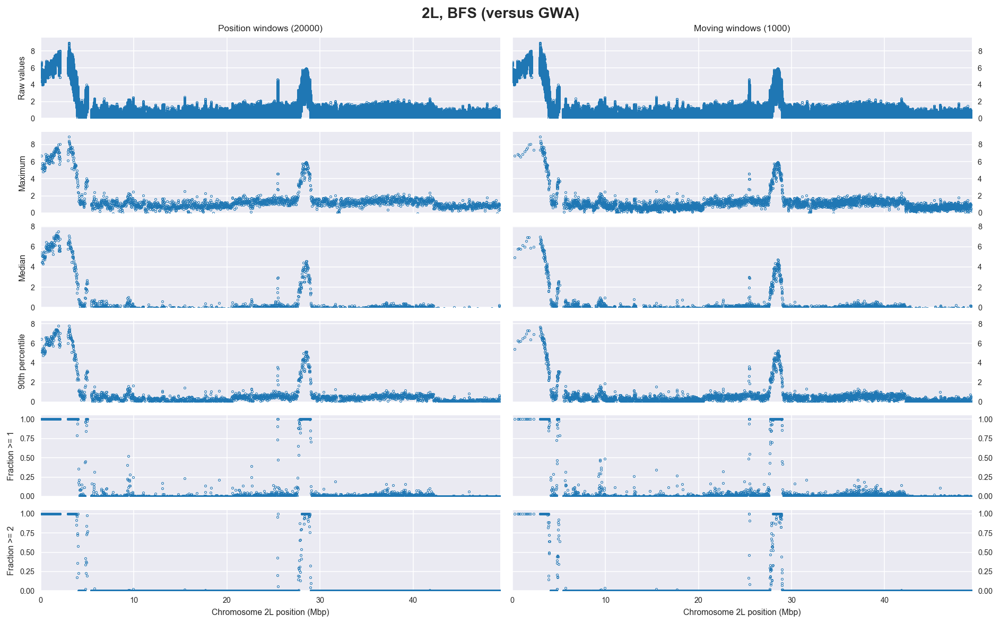

In [75]:
compare_summaries('2L', 'BFS', 'GWA')

position windows: 2661
moving windows: 5022


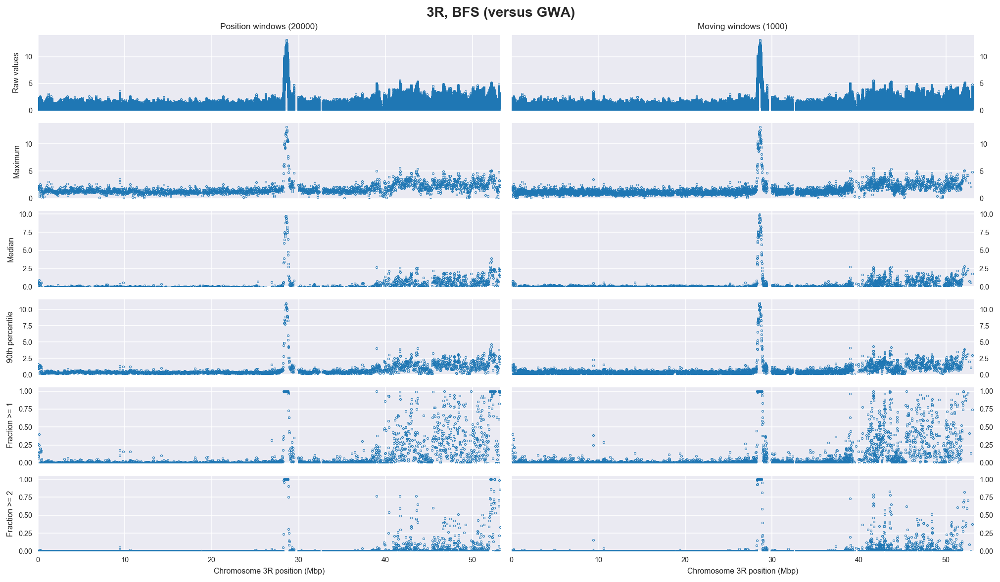

In [76]:
compare_summaries('3R', 'BFS', 'GWA')

position windows: 2099
moving windows: 3640


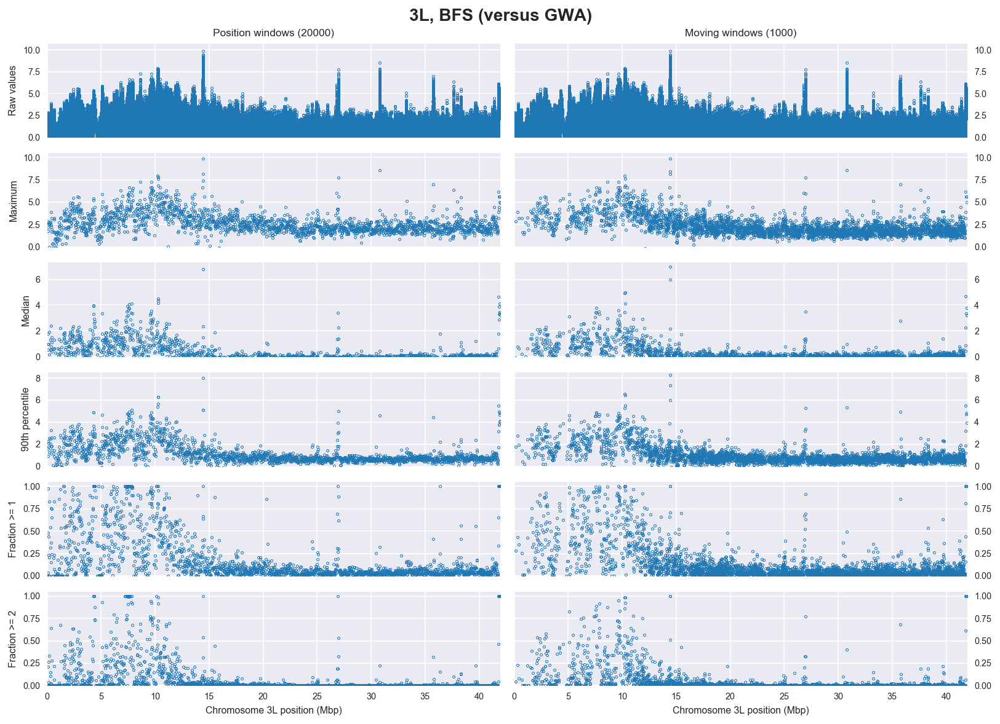

In [77]:
compare_summaries('3L', 'BFS', 'GWA')

position windows: 1220
moving windows: 1776


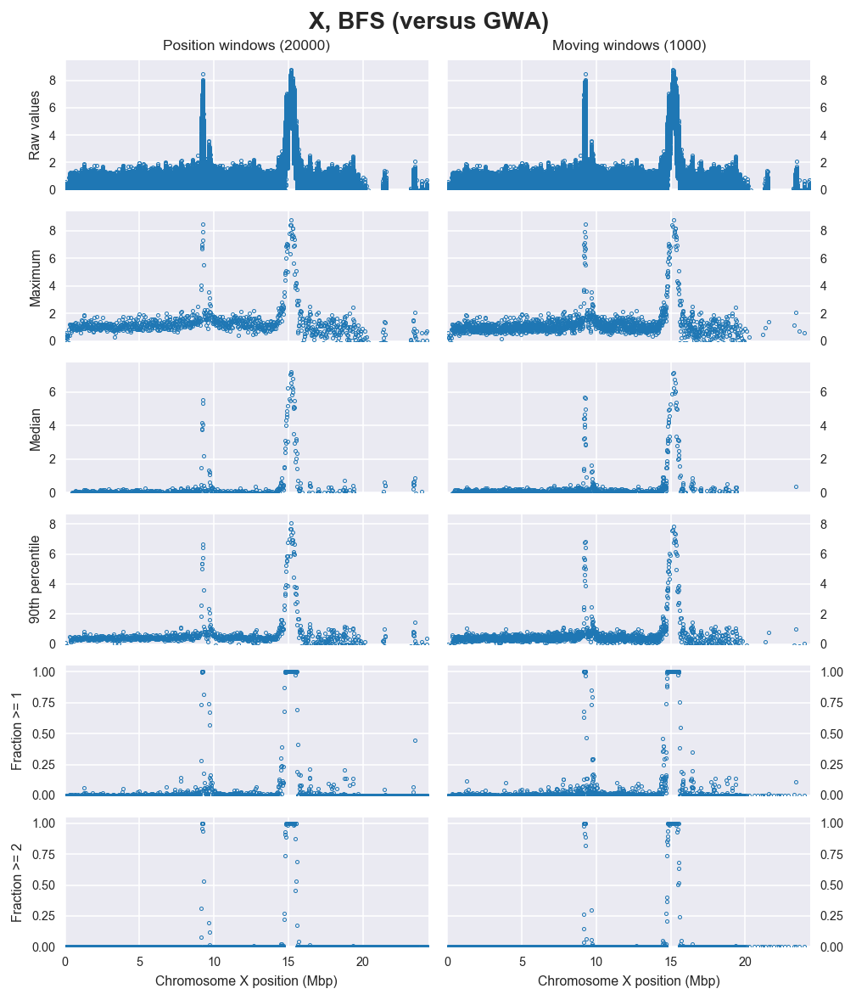

In [78]:
compare_summaries('X', 'BFS', 'GWA')

### GWA (versus BFS)

position windows: 3078
moving windows: 5547


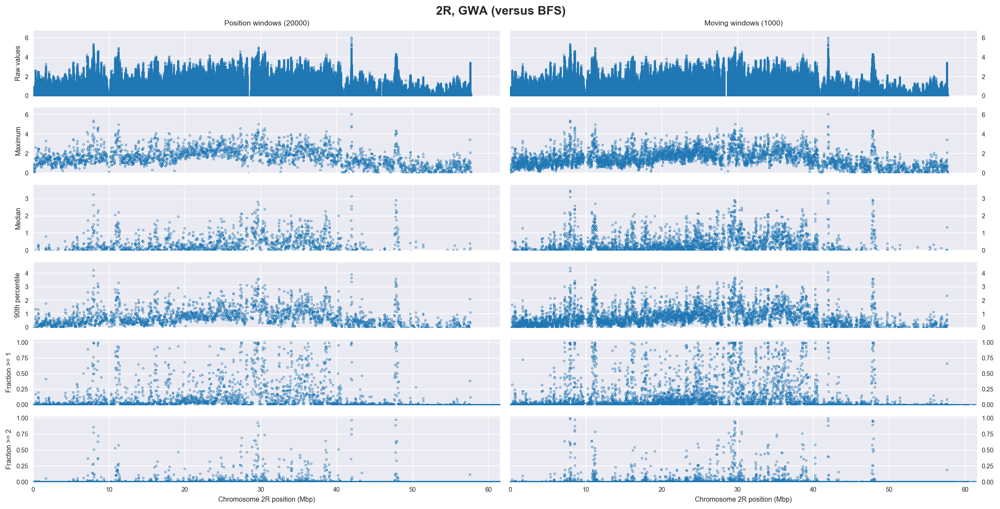

In [79]:
compare_summaries('2R', 'BFS', 'GWA', flip=True)

position windows: 2469
moving windows: 4148


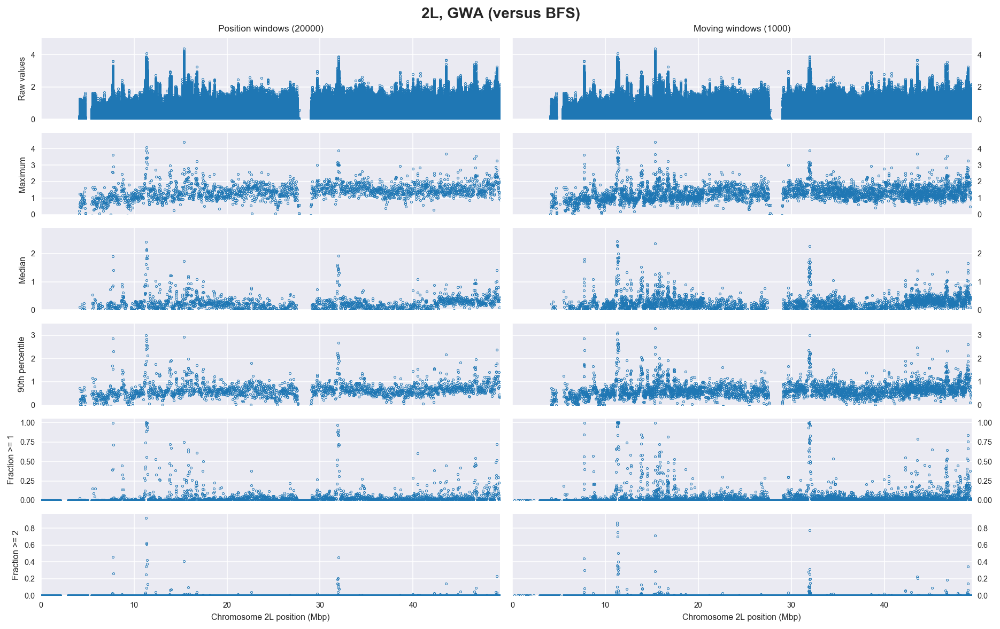

In [80]:
compare_summaries('2L', 'BFS', 'GWA', flip=True)

position windows: 2661
moving windows: 5022


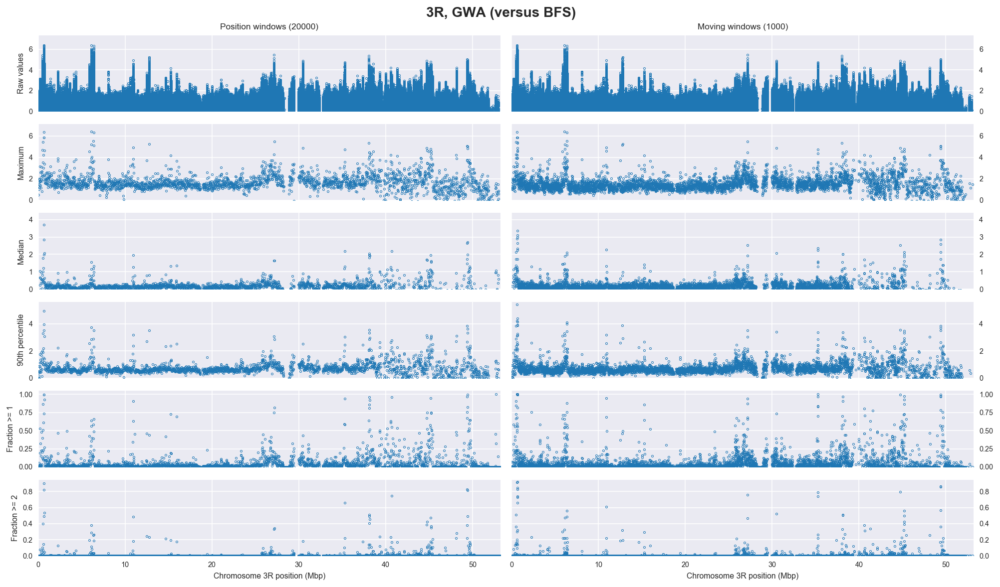

In [81]:
compare_summaries('3R', 'BFS', 'GWA', flip=True)

position windows: 2099
moving windows: 3640


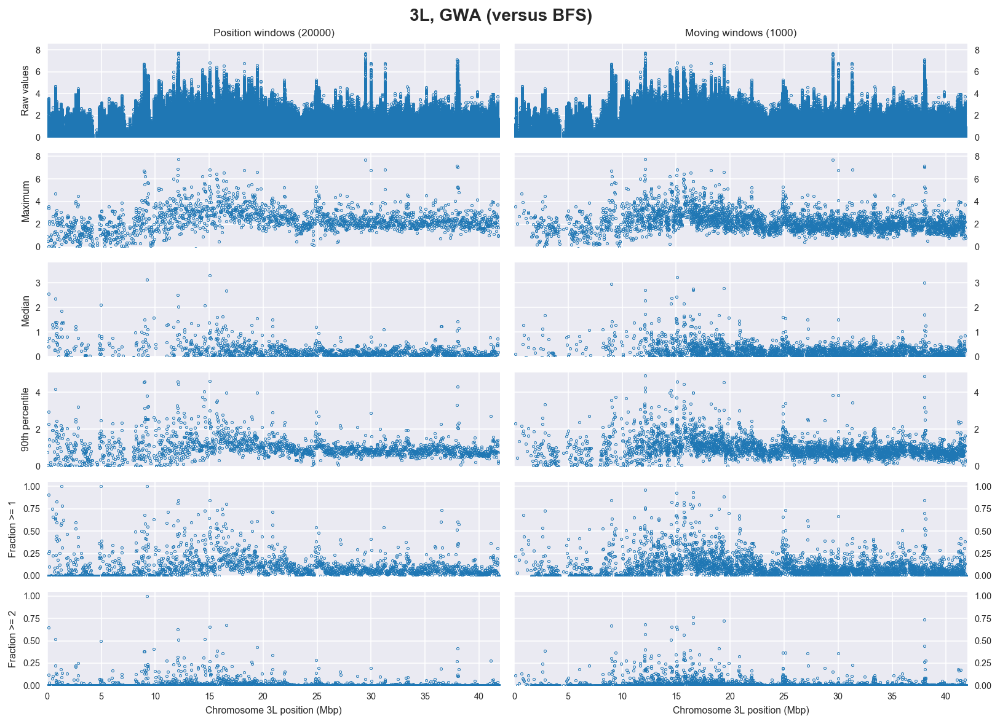

In [82]:
compare_summaries('3L', 'BFS', 'GWA', flip=True)

position windows: 1220
moving windows: 1776


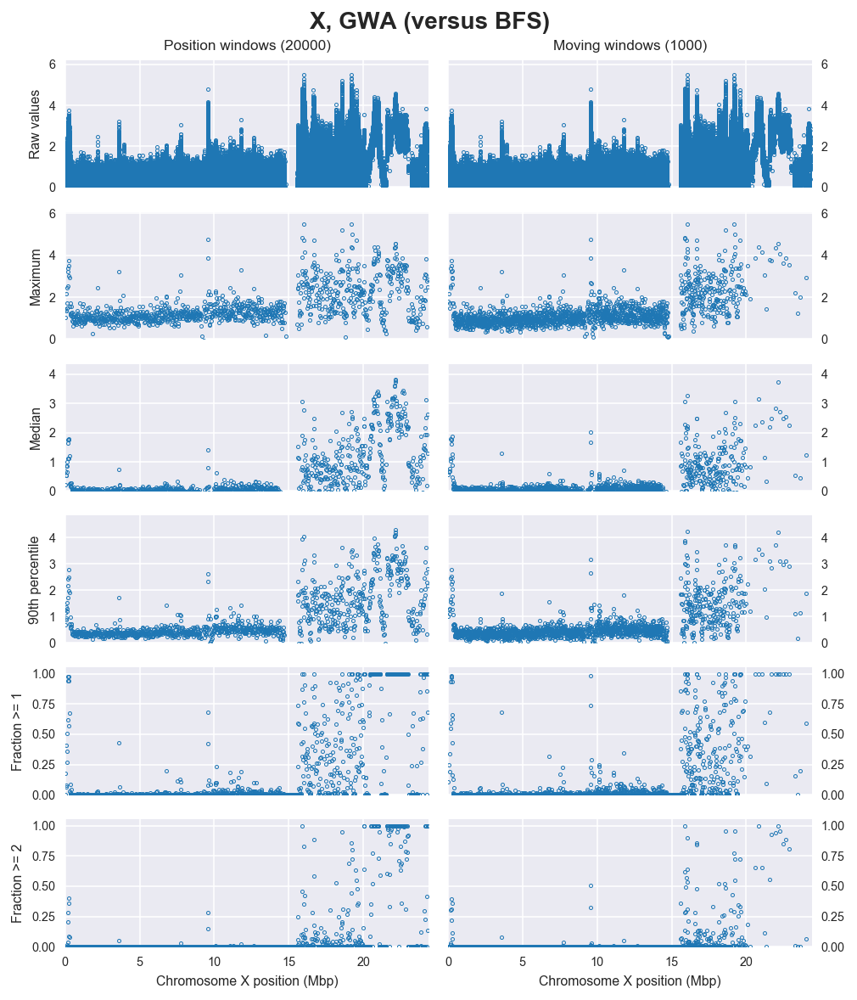

In [83]:
compare_summaries('X', 'BFS', 'GWA', flip=True)

### BFM (versus AOM)

position windows: 3078
moving windows: 3884


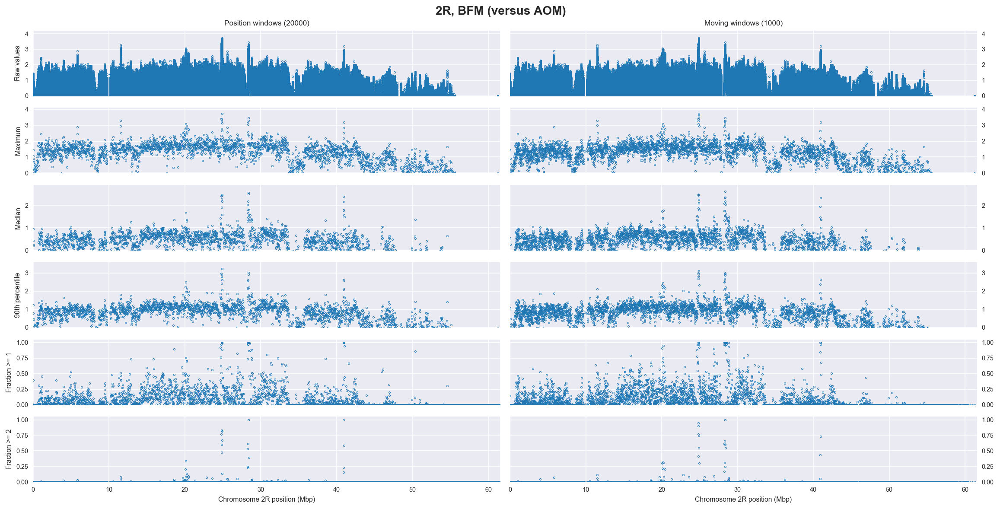

In [84]:
compare_summaries('2R', 'BFM', 'AOM')

position windows: 2469
moving windows: 3178


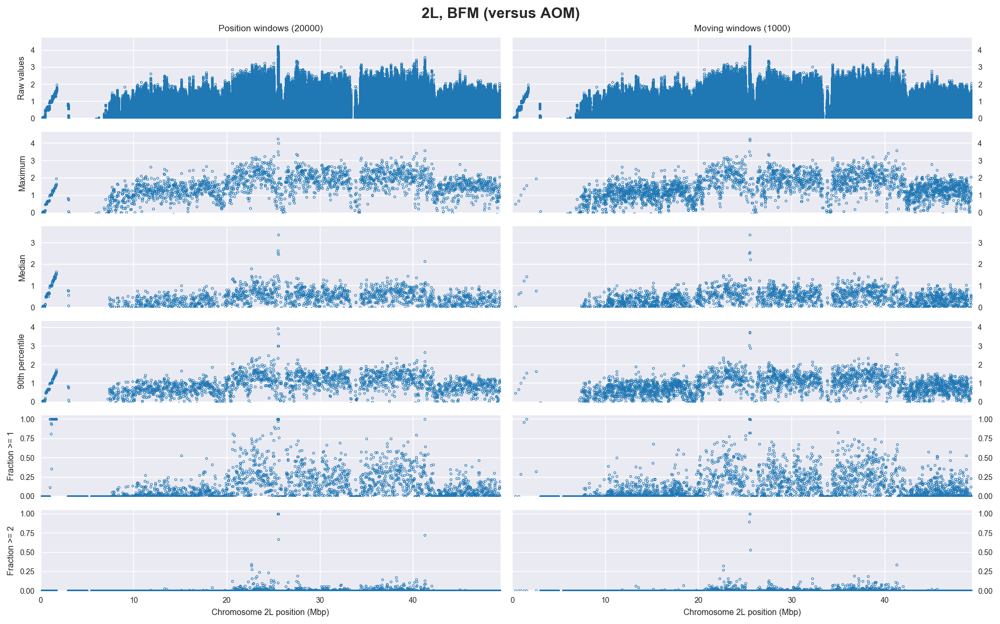

In [85]:
compare_summaries('2L', 'BFM', 'AOM')

position windows: 2661
moving windows: 3747


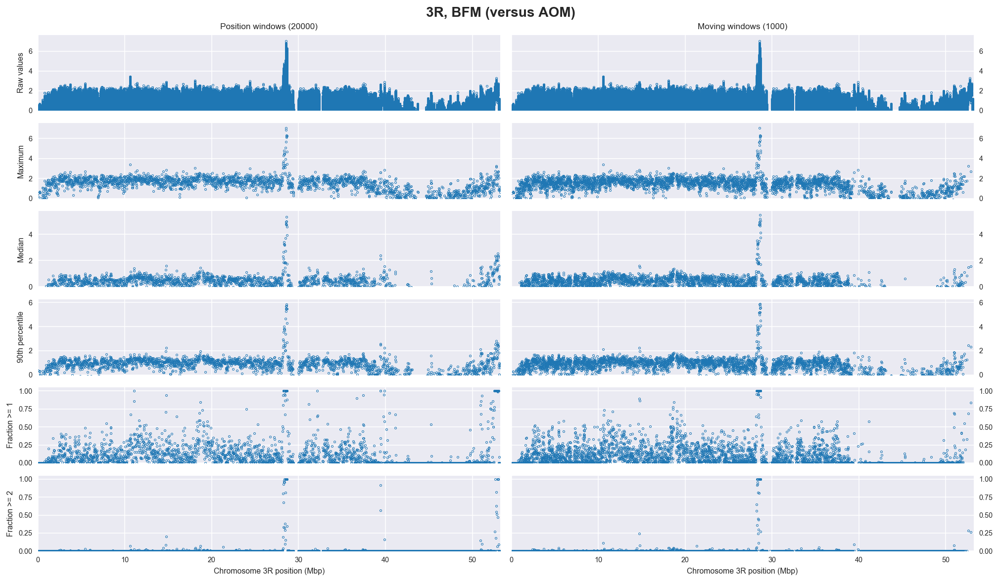

In [86]:
compare_summaries('3R', 'BFM', 'AOM')

position windows: 2099
moving windows: 2692


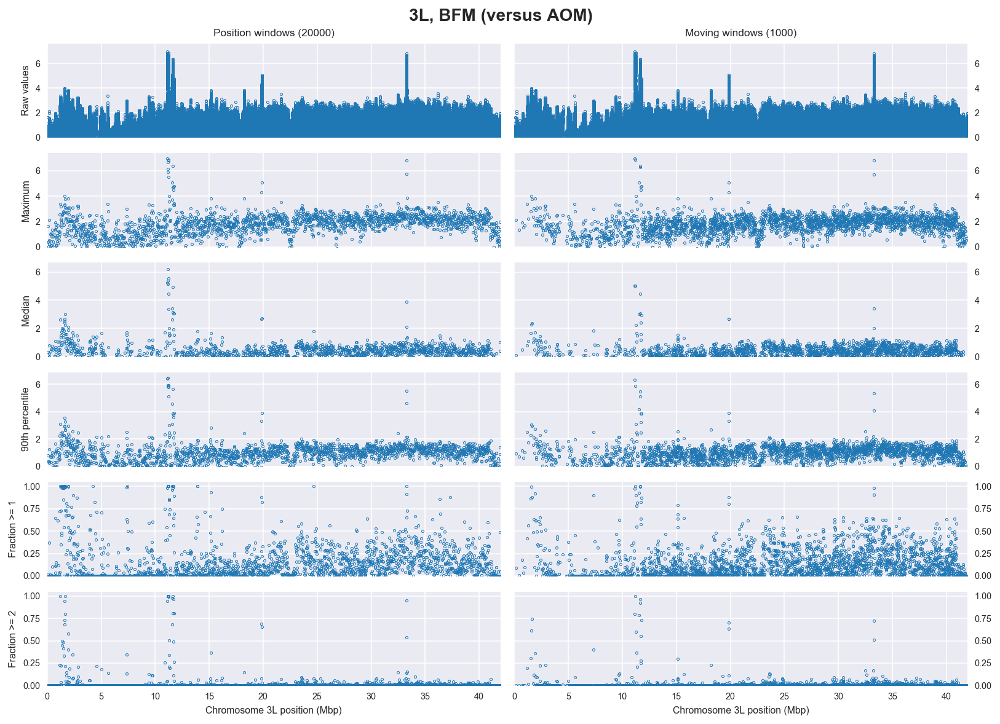

In [87]:
compare_summaries('3L', 'BFM', 'AOM')

position windows: 1220
moving windows: 1271


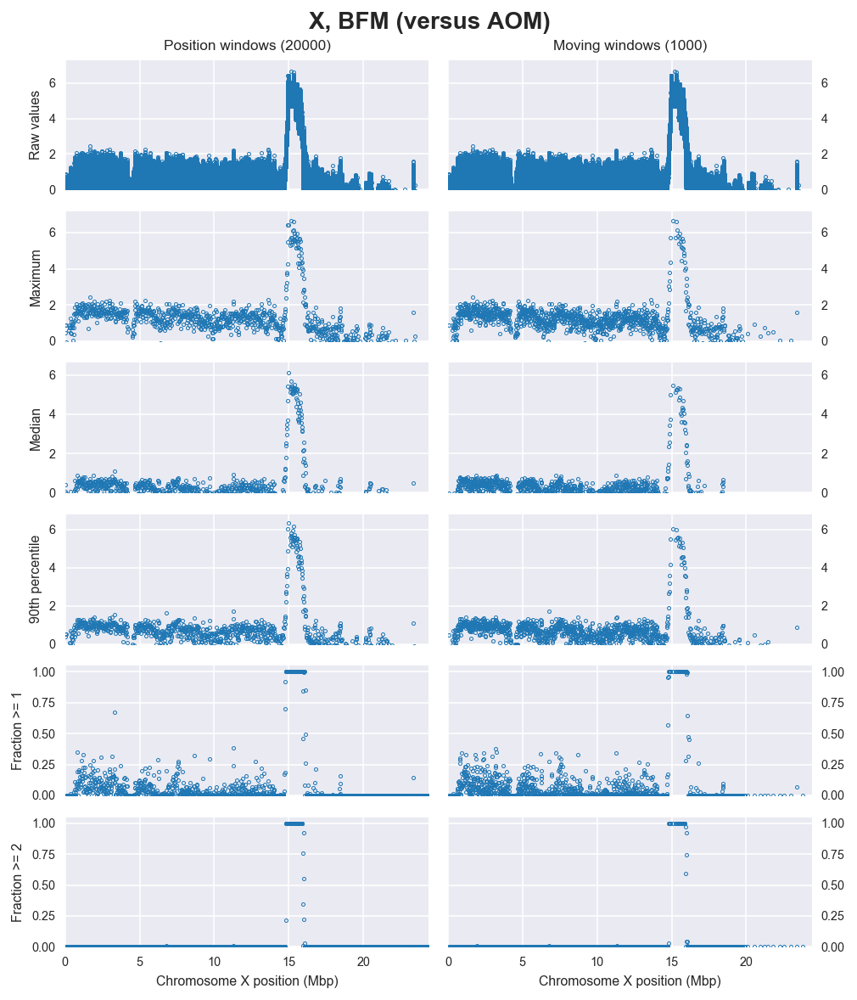

In [88]:
compare_summaries('X', 'BFM', 'AOM')

### AOM (versus BFM)

position windows: 3078
moving windows: 3884


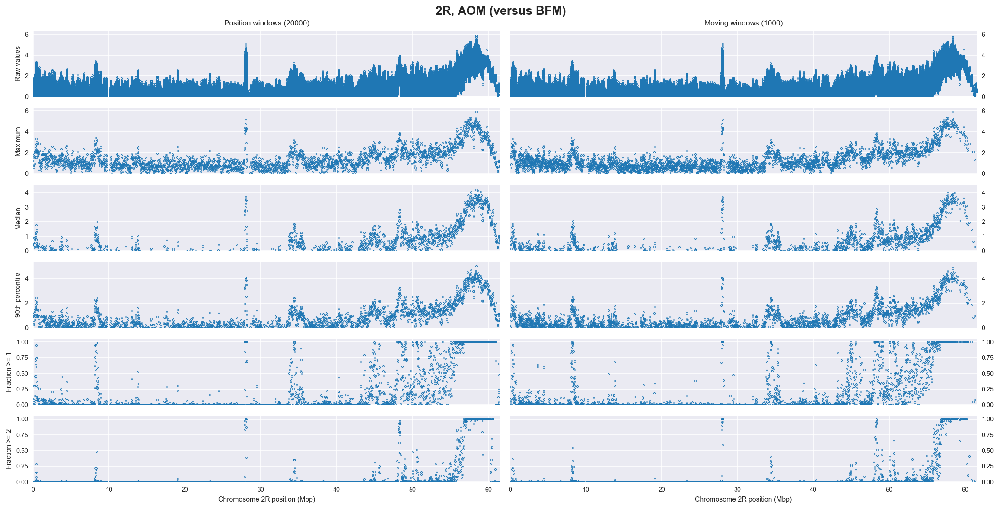

In [89]:
compare_summaries('2R', 'BFM', 'AOM', flip=True)

position windows: 2469
moving windows: 3178


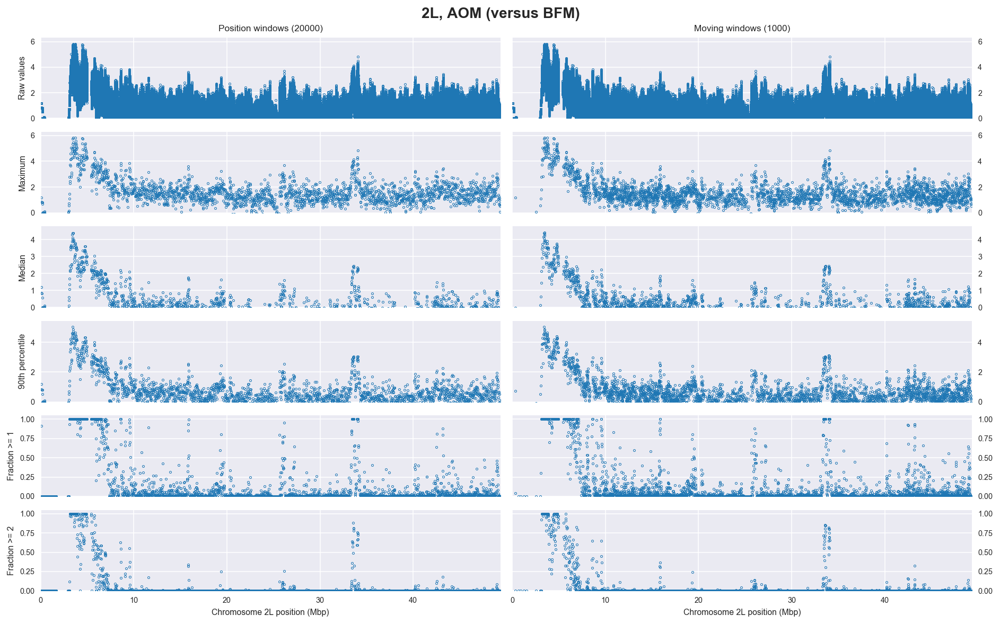

In [90]:
compare_summaries('2L', 'BFM', 'AOM', flip=True)

position windows: 2661
moving windows: 3747


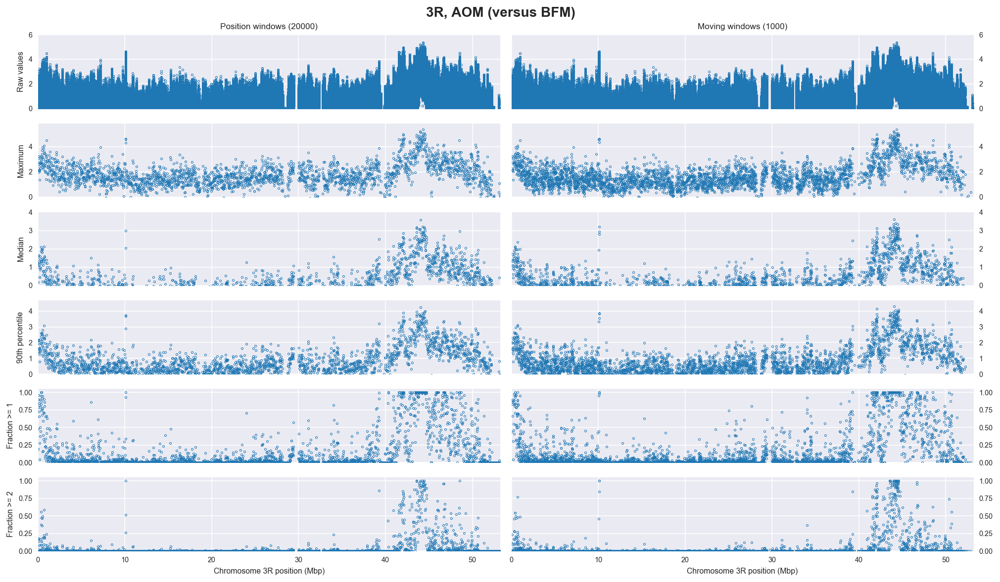

In [91]:
compare_summaries('3R', 'BFM', 'AOM', flip=True)

position windows: 2099
moving windows: 2692


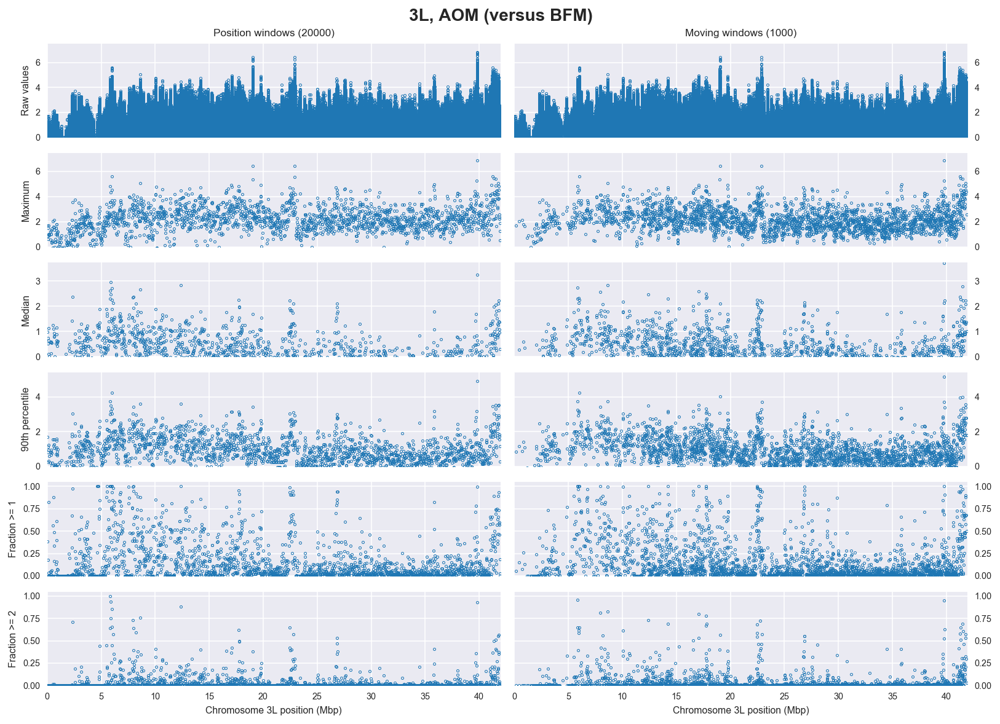

In [92]:
compare_summaries('3L', 'BFM', 'AOM', flip=True)

position windows: 1220
moving windows: 1271


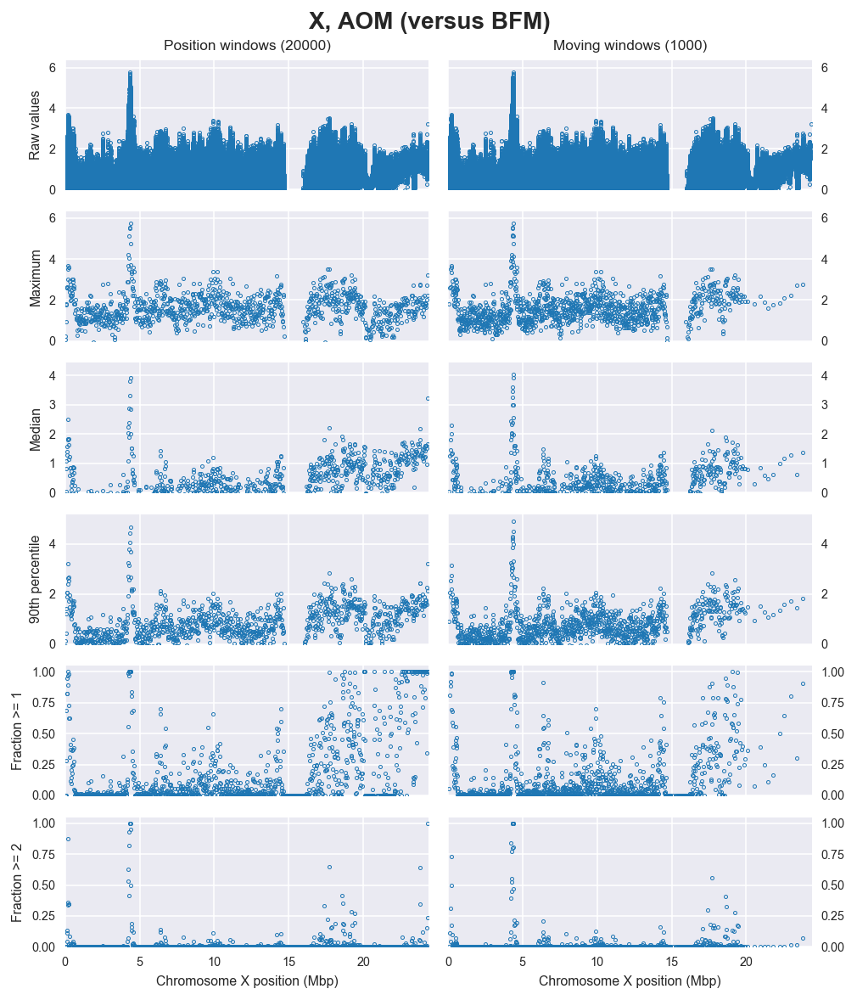

In [93]:
compare_summaries('X', 'BFM', 'AOM', flip=True)

## Try some peak fitting

In [94]:
def try_peak_fit(seqid, pop1, pop2, flip, center, statistic, flank=3, moving_window_size=1000):

    pairexp_fitter = rockies.PairExponentialPeakFitter(
        amplitude=lmfit.Parameter(value=3, vary=True, min=0),
        decay=lmfit.Parameter(value=0.3, vary=True, min=0.05),
        c=lmfit.Parameter(value=2, vary=True, min=0, max=5),
        cap=lmfit.Parameter(value=5, vary=True)
    )

    # setup raw values
    comparison = '%svs%s' % (pop1, pop2)
    focal_pop = pop2 if flip else pop1
    ref_pop = pop1 if flip else pop2
    grp = xpehh_raw[seqid][comparison]
    pos = grp['POS'][:]
    values = grp['XPEHH_zscore'][:]
    if flip:
        values = - values
    nomiss = ~np.isnan(values)
    pos_nomiss = pos[nomiss]
    values_nomiss = values[nomiss]
    
    # moving windows
    wx = allel.moving_statistic(pos_nomiss, statistic=np.mean, size=moving_window_size) / 1e6
    if statistic == 'max':
        wy = allel.moving_statistic(values_nomiss, statistic=np.max, size=moving_window_size)    
    elif statistic == 'median':
        wy = allel.moving_statistic(values_nomiss, statistic=lambda values: np.percentile(values, 50), size=moving_window_size)
    elif statistic == 'pc90':
        wy = allel.moving_statistic(values_nomiss, statistic=lambda values: np.percentile(values, 90), size=moving_window_size)  
    elif statistic == 'frc1':
        wy = allel.moving_statistic(values_nomiss, statistic=fraction_above(1), size=moving_window_size)
    elif statistic == 'frc2':
        wy = allel.moving_statistic(values_nomiss, statistic=fraction_above(2), size=moving_window_size)
    else:
        raise ValueError(statistic)

    fit = pairexp_fitter.fit(wx, wy, center, flank)
    rockies.plot_peak_fit(fit, figsize=(14, 5), xlabel='Physical distance (Mbp)')

### Cyp6p

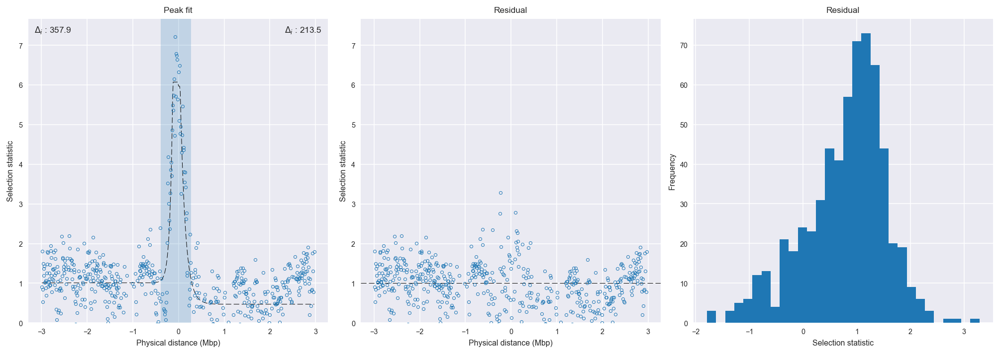

In [95]:
try_peak_fit('2R', 'BFS', 'GWA', flip=False, center=28.5, statistic='max')

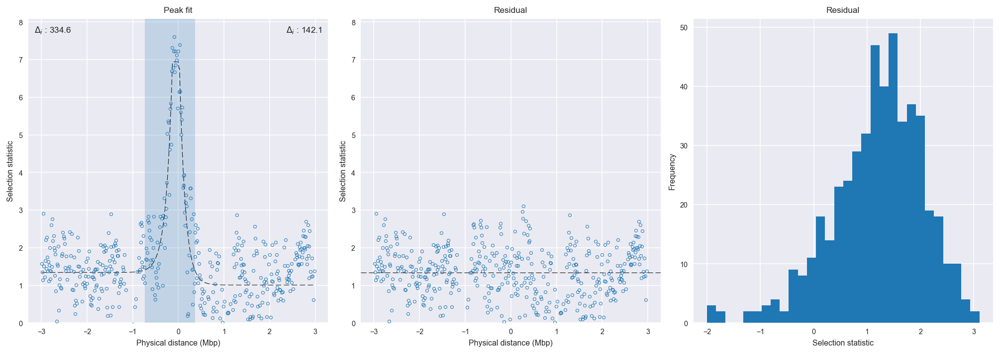

In [97]:
try_peak_fit('2R', 'BFM', 'GWA', flip=False, center=28.5, statistic='max')

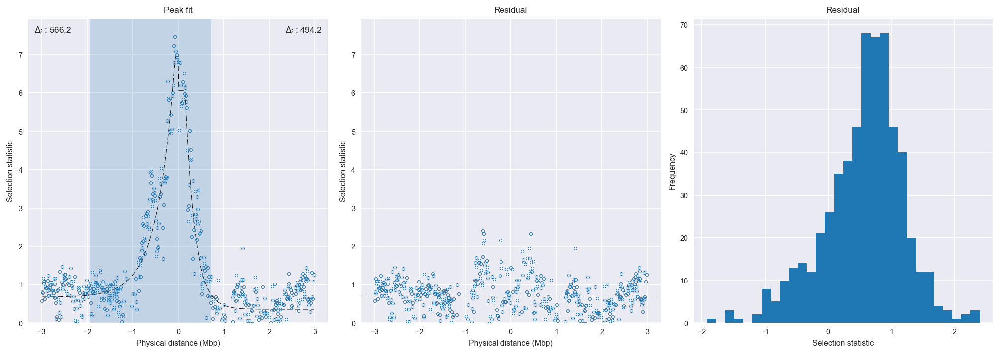

In [99]:
try_peak_fit('2R', 'UGS', 'GWA', flip=False, center=28.5, statistic='max')

### GSTE

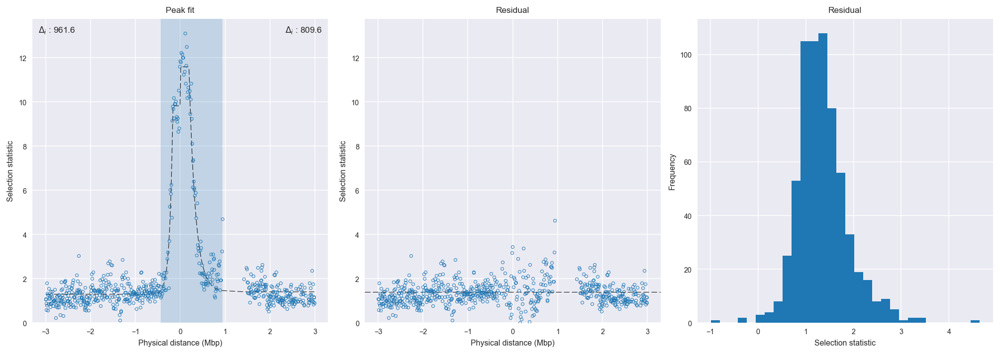

In [101]:
try_peak_fit('3R', 'BFS', 'GWA', flip=False, center=28.5, statistic='max')

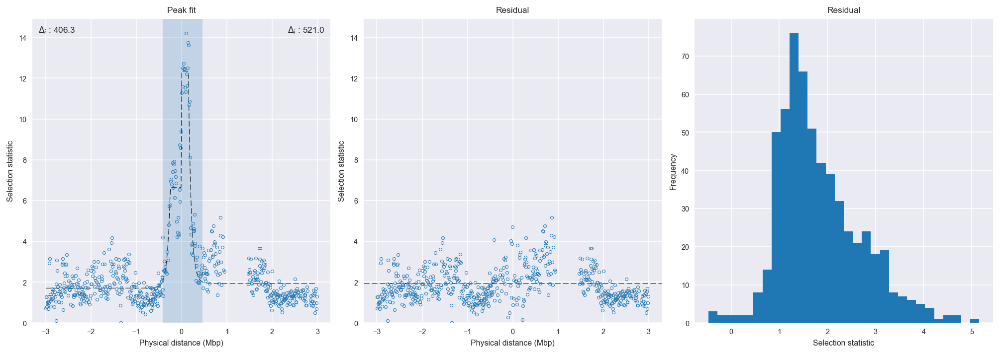

In [102]:
try_peak_fit('3R', 'BFM', 'GWA', flip=False, center=28.5, statistic='max')

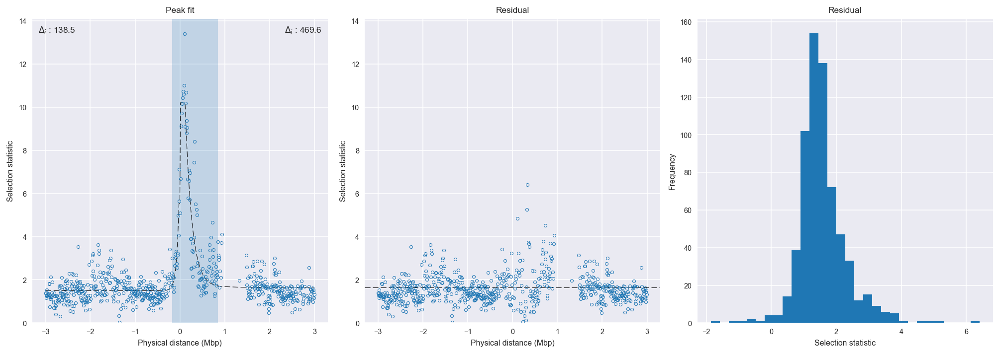

In [103]:
try_peak_fit('3R', 'UGS', 'GWA', flip=False, center=28.5, statistic='max')

### ACE1

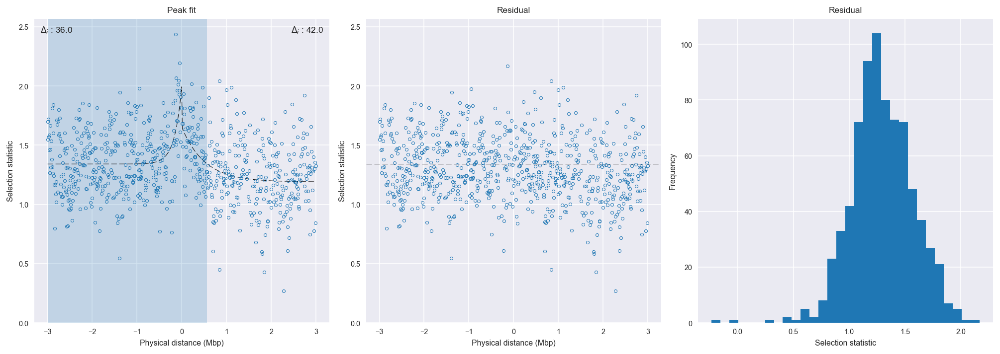

In [104]:
try_peak_fit('2R', 'BFS', 'GWA', flip=False, center=3.49, statistic='max')

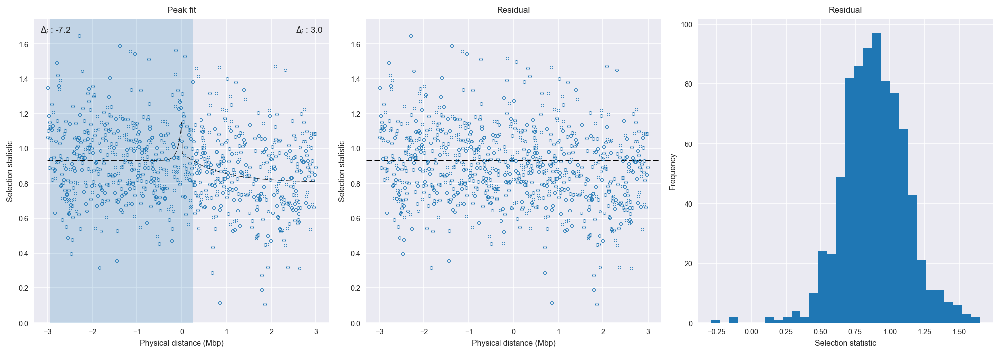

In [105]:
try_peak_fit('2R', 'UGS', 'GWA', flip=False, center=3.49, statistic='max')